## Simulus: a/i/p/t (three repetitions)

Only Pinyin experiment for this patient (no movement experiment).

In [1]:
import copy

from speech_pinyin_Ruijin.config import *
import glob
from scipy.io import wavfile
import matplotlib.pylab as plt
import mne
import numpy as np
from utils.util_MNE import keep_annotation
import itertools

pre_all: Running from CMD.
common_dl.py: Using CUDA.


In [2]:
sid=6
folder=data_dir+str(sid)+'-*'
folder=os.path.normpath(glob.glob(folder)[0])
folder=folder.replace("\\", "/")

In [3]:
# Read EEG
file=glob.glob(os.path.join(folder,'raw','*.edf'))[0]
raw = mne.io.read_raw_edf(file,preload=True)
raw.resample(sfreq=1000)

Measurement date,"December 16, 2024 11:43:02 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"193 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.00 Hz
Lowpass,500.00 Hz


## Loop through the following cells to preprocess different sessioins.

In [7]:
# Read audio
session=3
audio_folder=folder+'/raw/matlab/'
files=['sbt_202412161154','sbt2_202412161207','abt3_202412161224','sbt4_202412161232_escape']
file=audio_folder+files[session]+'/recording.wav'
#sf_audio,audio=librosa.load(file)
sf_audio,audio=wavfile.read(file)

C:\Users\xiaowu\AppData\Local\Temp\ipykernel_87312\3817898130.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sf_audio,audio=wavfile.read(file)


In [8]:
import hdf5storage
#filename=folder+'/raw/matlab/result/pinyin_simplified/JinKeFen_202409131117/prompt_shown.mat'
filename=audio_folder+files[session]+'/prompt_shown.mat'
mat=hdf5storage.loadmat(filename)
prompt_shown=mat['prompt_shown'][0]

In [10]:
classes=[]
for i in range(len(prompt_shown)):
    tmp1=prompt_shown[i][0].split("@")
    prompt=tmp1[1]
    time=datetime.strptime(tmp1[0],'%Y-%m-%d %H:%M:%S:%f')
    if prompt=='a':
        classes.append(1)
    elif prompt=='i':
        classes.append(2)
    elif prompt=='p':
        classes.append(3)    
    elif prompt=='k':
        classes.append(4)
    elif prompt=='':
        classes.append(99)

print(len(classes))

62


In [11]:
dummy_task=[i for i in range(len(classes)) if classes[i]==99]
print(dummy_task) # session 0: [10, 12];  session 3: [4, 57];

[4, 57]


In [12]:
# parse audio recordings
trial_begins=[]
beep=[1,0,1,0,1,0]
index=0
while index<len(audio)-10:
    if all(audio[index:index+6]==beep):
        trial_begins.append(index+6)
        index=index+5*48000 # jump before step-by-step search
    index=index+1
print(len(trial_begins))

62


In [13]:
# remove the beep
audio_clean=[]
lengths=[]
for i in range(len(trial_begins)):
    if i==len(trial_begins)-1: # the last trial
        trial_start=trial_begins[i]
        tmp=audio[trial_start:]
    else:
        trial_start=trial_begins[i]
        trial_stop=trial_begins[i+1]-6
        tmp=audio[trial_start:trial_stop]
    length=len(tmp)
    lengths.append(length/48000)
    audio_clean.append(tmp)
print(len(audio_clean))

62


In [15]:
audio2=[sample for sublist in audio_clean for sample in sublist]
len(audio2)/48000

477.37

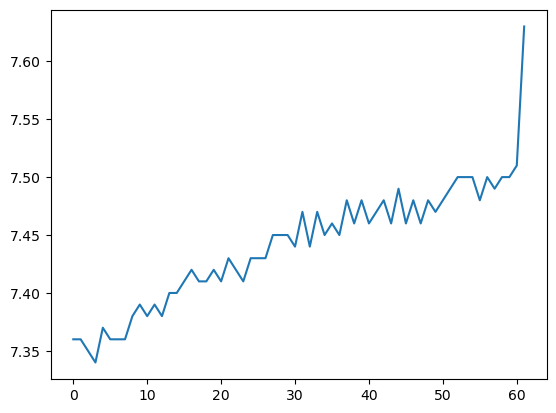

In [14]:
# save trial length
plt.plot(lengths)
filename=folder+'/processed/session'+str(session)+'_trial_length_audio'
#np.save(filename, np.array(lengths, dtype=object), allow_pickle=True)

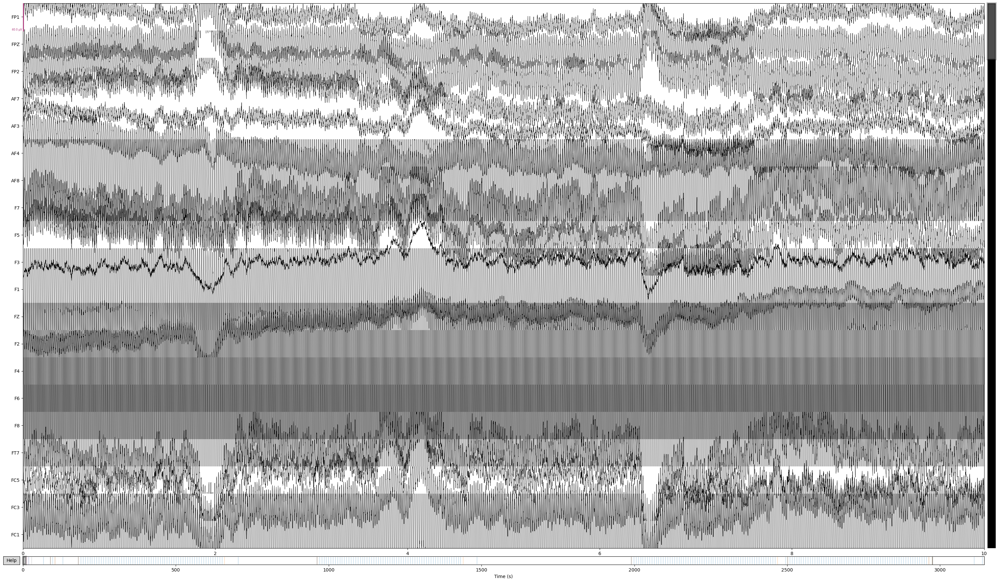

In [17]:
%matplotlib qt
raw.plot()

In [15]:
if session==0:
    raw_pinyin=raw.copy().crop(tmin=175 ,tmax=662) # first session
elif session==1:
    raw_pinyin=raw.copy().crop(tmin=956 ,tmax=1442) # second session
elif session==2:
    raw_pinyin=raw.copy().crop(tmin=1986 ,tmax=2469) # second session
elif session==3:
    raw_pinyin=raw.copy().crop(tmin=2497 ,tmax=2966) # second session

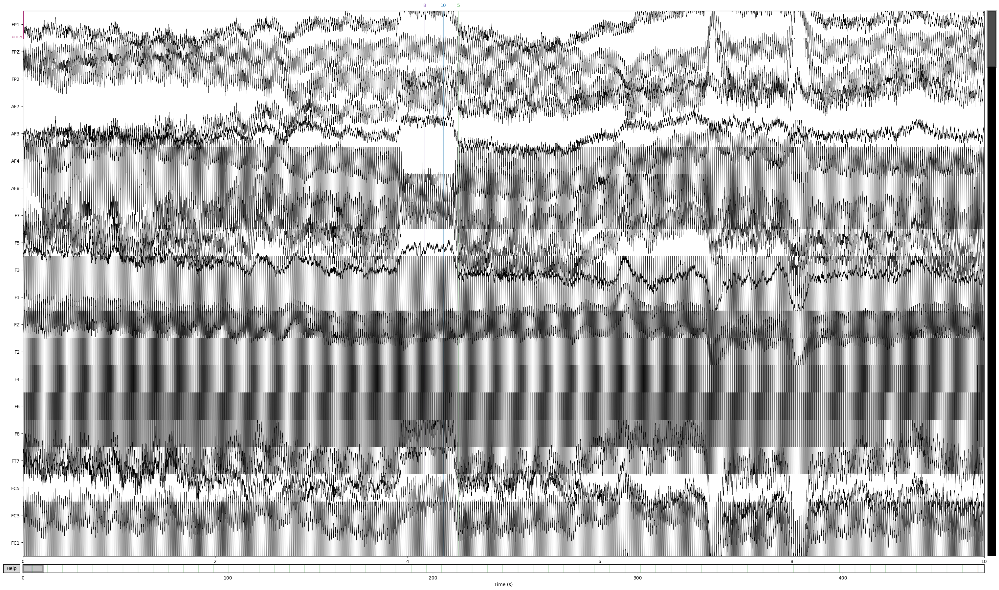

In [16]:
%matplotlib qt
raw_pinyin.plot()

In [17]:
events_tmp=mne.find_events(raw_pinyin, stim_channel='Trigger')
events_tmp

array([[2501385,   75844,  126934],
       [2501599,   95839,  126934],
       [2501745,   45851,  126934],
       [2509109,   45851,  126934],
       [2516463,   45851,  126934],
       [2523808,   45851,  126934],
       [2531166,   45851,  126934],
       [2538526,   45851,  126934],
       [2545888,   45851,  126934],
       [2553253,   45851,  126934],
       [2560619,   45851,  126934],
       [2568007,   45851,  126934],
       [2575384,   45851,  126934],
       [2582766,   45851,  126934],
       [2590158,   45851,  126934],
       [2597552,   45851,  126934],
       [2604944,   45851,  126934],
       [2612348,   45851,  126934],
       [2619762,   45851,  126934],
       [2627177,   45851,  126934],
       [2634589,   45851,  126934],
       [2642002,   45851,  126934],
       [2649417,   45851,  126934],
       [2656844,   45851,  126934],
       [2664267,   45851,  126934],
       [2671680,   45851,  126934],
       [2679107,   45851,  126934],
       [2686532,   45851,  1

In [20]:
# Triggers sent by matlab is different in eeg. 1->82127; 8->110417; 10->118433; 5->98158; 2->86135;
# 91---92---93---5---5--5--94--94--5---5---5---93

# However, in this patient, events_tmp[:,-1] is not longer these: [82127,110417,118433,98158,86135]
import copy
events_tmp2=copy.deepcopy(events_tmp)
if session==0:
    events_tmp2[0,-1]=92 # 8
    events_tmp2[1,-1]=93 # 10
    events_tmp2[-1,-1]=93 # 10
    events_tmp2[2:-1,-1]=5 # 5
elif session==3:
    events_tmp2[0,-1]=92 # 8
    events_tmp2[1,-1]=93 # 10
    events_tmp2[-2,-1]=94 # 2
    events_tmp2[-1,-1]=93 # 10
    events_tmp2[2:-2,-1]=5 # 10
'''
for i in range(events_tmp.shape[0]):
    if events_tmp[i,-1]==82127:
        events_tmp2[i,-1]=91
    elif events_tmp[i,-1]==110417:
        events_tmp2[i,-1]=92
    elif events_tmp[i,-1]==118433:
        events_tmp2[i,-1]=93
    elif events_tmp[i,-1]==98158:
        events_tmp2[i,-1]=5
    elif events_tmp[i,-1]==86135:
        events_tmp2[i,-1]=94 # pause
'''
events=copy.deepcopy(events_tmp2)
j=0
for i in range(events_tmp2.shape[0]):
    if events_tmp2[i,-1]==5:
        #if classes[j] !=99:
        events[i,-1]=classes[j]
        j=j+1
print(str(j))

# extract task event ('5')
events_tasks=np.asarray([event for event in events if event[-1] not in [91,92,93,94]])
print(len(events_tasks)) # some of them are '99' (silent task).

62
62


In [21]:
raw_pinyin.add_events(events_tasks, "Trigger",replace=True)

In [22]:
intervals=[]
for i in range(len(events_tasks)-1):
    start=events_tasks[i,0]
    end=events_tasks[i+1,0]
    tmp=(end-start)/1000
    intervals.append(tmp)
intervals.append(7) # the last trial;

In [39]:
%matplotlib inline
lengths2=[lengths[i] for i in range(len(lengths)) if i not in dummy_task]
intervals2=[intervals[i] for i in range(len(intervals)) if i not in dummy_task]
difference=[i-j for i,j in zip(lengths2, intervals2)]
accum=np.cumsum(difference)
plt.plot(difference)

In [23]:
tmp=raw_pinyin.ch_names # keep only channels whose name is number, discard channels with non-numerical name.
ch_names=[i for i in tmp if i[0].isdigit()]
ch_names.append('Trigger')

In [24]:
raw_pinyin.pick(picks=ch_names)
#raw_pinyin.drop_channels(['135','136','159','160']+[str(i) for i in range(163,193)])
#raw_pinyin.drop_channels(['72','ECG','LEMG','REMG'])
#raw_pinyin.drop_channels(['64','102','24']) # these three channels have much higher broadband power then others;

Measurement date,"December 16, 2024 11:43:02 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"128 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.00 Hz
Lowpass,500.00 Hz


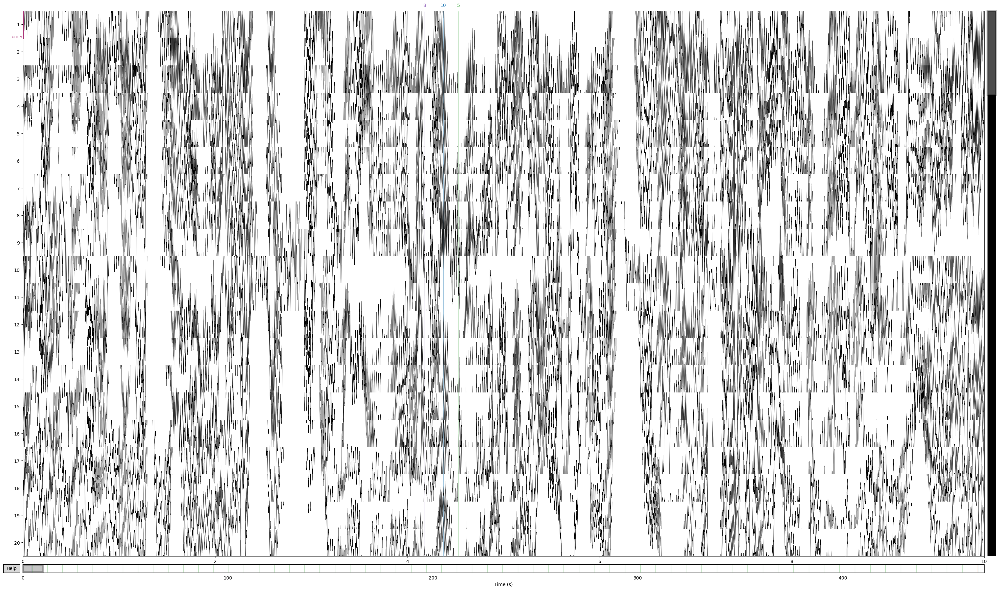

In [25]:
%matplotlib qt
raw_pinyin.plot()

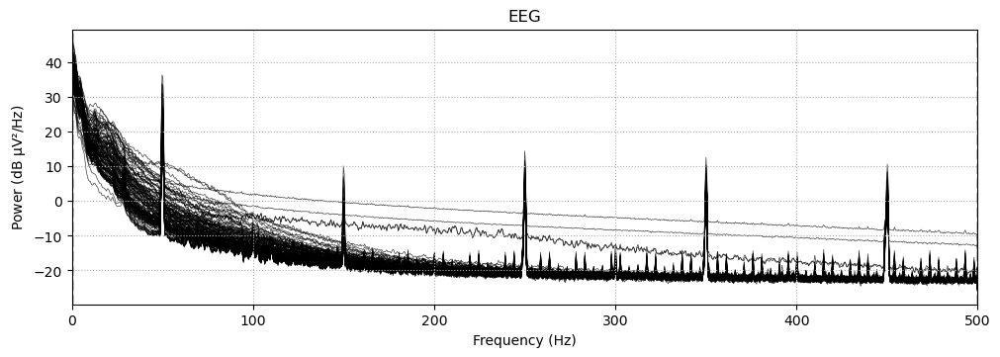

In [26]:
%matplotlib qt
raw_pinyin.compute_psd().plot() # Very strange PSD profile;

In [27]:
#raw_pinyin.filter(50,495) # test if the low decoding accuracy was caused by the wierd PSD around 10-30 Hz: the same.
raw_pinyin.filter(1,495)
frequency=np.asarray([50, 150, 250, 350, 450]) #np.arange(50, 500, 50).tolist()
raw_pinyin.notch_filter(freqs=frequency)
#notch_widths=np.asarray([3,1,3,1,3,1,3,1,3]) #np.asarray([3,]*len(frequency))
#raw_pinyin.notch_filter(freqs=frequency,notch_widths=notch_widths)

Measurement date,"December 16, 2024 11:43:02 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,"128 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,1.00 Hz
Lowpass,495.00 Hz


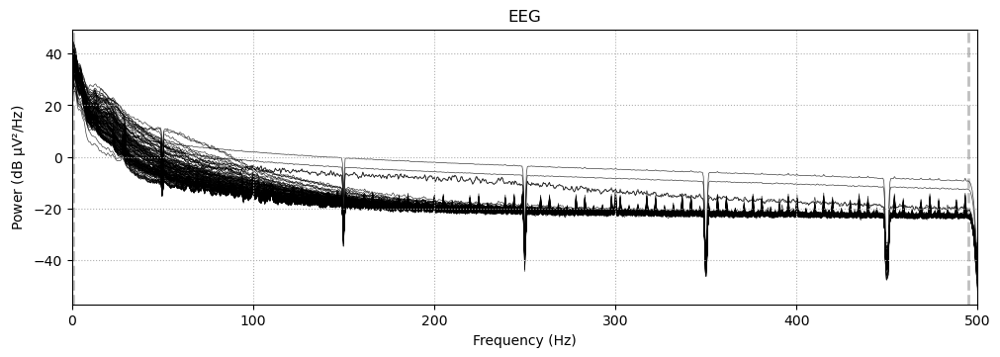

In [28]:
%matplotlib qt
raw_pinyin.compute_psd().plot()

In [29]:
filename=folder+'/processed/pinyin_'+str(session)+'.fif'
raw_pinyin.save(filename,overwrite=True)

Below is to check the TF representation of the data.

In [97]:
test_on='pinyin'

if test_on=='pinyin':
    raw_pinyin=mne.io.read_raw_fif(filename)#('D:/data/BaiduSyncdisk/speech_pinyin/3-135/processed/pinyin.fif')
    events_tmp=mne.find_events(raw_pinyin, stim_channel='Trigger')
    tmp=[]
    for aa in events_tmp:
        if aa[-1]!=99:
            tmp.append(aa)
    events=np.asarray(tmp)
    epochs_all = mne.Epochs(raw_pinyin, events, tmin=0, tmax=7.3,baseline=None)
    
    task_id=1 # 1/2/3/4
    epochs=epochs_all[str(task_id)]
    epochs=epochs_all
elif test_on=='movement':
    raw_movement=mne.io.read_raw_fif('D:/data/BaiduSyncdisk/speech_pinyin/3-135/processed/movement.fif')
    events=mne.find_events(raw_movement, stim_channel='Trigger')
    epochs_all = mne.Epochs(raw_movement, events, tmin=0, tmax=10,baseline=None)
    
    task_id=1
    #epochs=epochs_all[str(task_id)]
    epochs=epochs_all

In [101]:
decim=4
new_fs=1000/decim
n_cycles_mthod='stage' # or: equal
vmin=-4
vmax=4
fMin,fMax=2,150
fstep=1
freqs=np.arange(fMin,fMax,fstep) #148
fNum=freqs.shape[0]
#freqs = np.linspace(fMin,fMax, num=fNum)
cycleMin,cycleMax=8,50
cycleNum=fNum
#n_cycles = np.linspace(cycleMin,cycleMax, num=cycleNum)  # different number of cycle per frequency
groups=5
rates=[2,2.5,3,4,5]
num_per_group=int(fNum/groups)
if n_cycles_mthod=='equal':
    n_cycles=freqs
elif n_cycles_mthod=='stage':
    n_cycles=[]
    for g in range(groups):
        if g < groups -1:
            tmp=[int(i) for i in freqs[g*num_per_group:(g+1)*num_per_group]/rates[g]]
        elif g==groups -1:
            tmp = [int(i) for i in freqs[g * num_per_group:] / rates[g]]
        n_cycles.extend(tmp)

In [107]:
# better than the above MNE method.
%matplotlib inline
from mne.time_frequency import tfr_morlet
if test_on=='pinyin':
    baseline = [int(0*new_fs), int(3*new_fs)]
elif test_on=='movement':
    baseline = [int(0*new_fs), int(5*new_fs)]
ch_names=epochs.ch_names
chnNum=len(ch_names)
chid=0
for chid in range(chnNum-1):
    fig,ax=plt.subplots()
    chname=epochs.ch_names[chid]
    # The very big artifact at begainning and end of the TF will cause ERS vanish after normalization.
    ch_power=np.squeeze(tfr_morlet(epochs, picks=[chname], freqs=freqs, n_cycles=n_cycles,use_fft=True,return_itc=False, 
                                   average=True, decim=decim, n_jobs=1).data) # (148, 1251) (frequency, time)

    base = ch_power[:, baseline[0]:baseline[1]] #  (148, 175)
    basemean = np.mean(base, 1) # (148)
    basestd= np.std(base, 1) #(148) 
    #ch_power_norm = 10*np.log10(ch_power / basemean[:, :, None]) #
    ch_power_norm=(ch_power-basemean[:,None])/basestd[:,None]
    ax.imshow(ch_power_norm,origin='lower', cmap='RdBu_r',vmin=vmin, vmax=vmax) # same as below
    ax.set_aspect('auto')
    filename=folder+'/processed/tf_result_pinyin_1task/ch_'+str(chid)+'.png'
    fig.savefig(filename, dpi=400)
    fig.clear()
    plt.close(fig)

The best plot:

![](img\16.png)